# Yelp Amenity Data cleaning and exploratory analysis

In [314]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import altair as alt
from sklearn.cluster import KMeans
import re
from wordcloud import WordCloud


# Show all columns in dataframes
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

np.seterr(invalid="ignore");

In [196]:
# phila bounds
phl_bound = gpd.read_file("data/Yelp API/phl_bound.geojson")
phl_neigh = gpd.read_file("https://raw.githubusercontent.com/opendataphilly/open-geo-data/master/Neighborhoods_Philadelphia/Neighborhoods_Philadelphia.geojson")
phl_tract = gpd.read_file("data/Yelp API/census-tracts.geojson")

In [197]:
phl_bound_proj = phl_bound.to_crs(2272)
phl_neigh_proj = phl_neigh.to_crs(2272)
phl_tract_proj = phl_tract.to_crs(2272)

In [118]:
neigh = phl_neigh_proj[["mapname", "geometry"]]

In [199]:
tract = phl_tract_proj[["neighborhood_name", "geometry"]]

## Read in amenity files

In [857]:
# amenities
restaurants = gpd.read_file("data/Yelp API/restaurants.geojson")
parks = gpd.read_file("data/Yelp API/parks.geojson")
education = gpd.read_file("data/Yelp API/education.geojson")
grocery = gpd.read_file("data/Yelp API/grocery.geojson")

arts = gpd.read_file("data/Yelp API/arts.geojson")
beauty = gpd.read_file("data/Yelp API/beauty.geojson")
entertainment = gpd.read_file("data/Yelp API/entertainment.geojson")
kids = gpd.read_file("data/Yelp API/kids.geojson")
nightlife = gpd.read_file("data/Yelp API/nightlife.geojson")
public_space = gpd.read_file("data/Yelp API/outdoors.geojson")
retail = gpd.read_file("data/Yelp API/retail.geojson")
shopping = gpd.read_file("data/Yelp API/shopping.geojson")

In [858]:
restaurants["type"] = "restaurant"
arts["type"] = "arts"
beauty["type"] = "beauty"
entertainment["type"] = "entertainment"
kids["type"] = "kids"
nightlife["type"] = "nightlife"
parks["type"] = "parks"
public_space["type"] = "public space"
retail["type"] = "retail"
shopping["type"] = "shopping"
grocery["type"] = "grocery"
education["type"] = "education"

In [859]:
# combine gdfs
amenities = gpd.GeoDataFrame(pd.concat([restaurants, arts, beauty, entertainment, kids, nightlife, parks, public_space, retail, shopping, grocery, education], ignore_index=True))

In [860]:
len(amenities)

16176

# Clip to Philadelphia boundaries

In [861]:
phl_bound_squeezed = phl_bound_proj.squeeze().geometry

# Amenity spatial patterns

In [862]:
amenities_phl = amenities.within(phl_bound_squeezed)
amenities_phl_gdf = amenities[amenities_phl]
amenities_phl_gdf.explore(tiles='CartoDB dark_matter', legend=True, column='type', cmap='Paired')

In [863]:
# count by type
amenities_grouped = amenities_phl_gdf.groupby('type').size().reset_index(name='count')

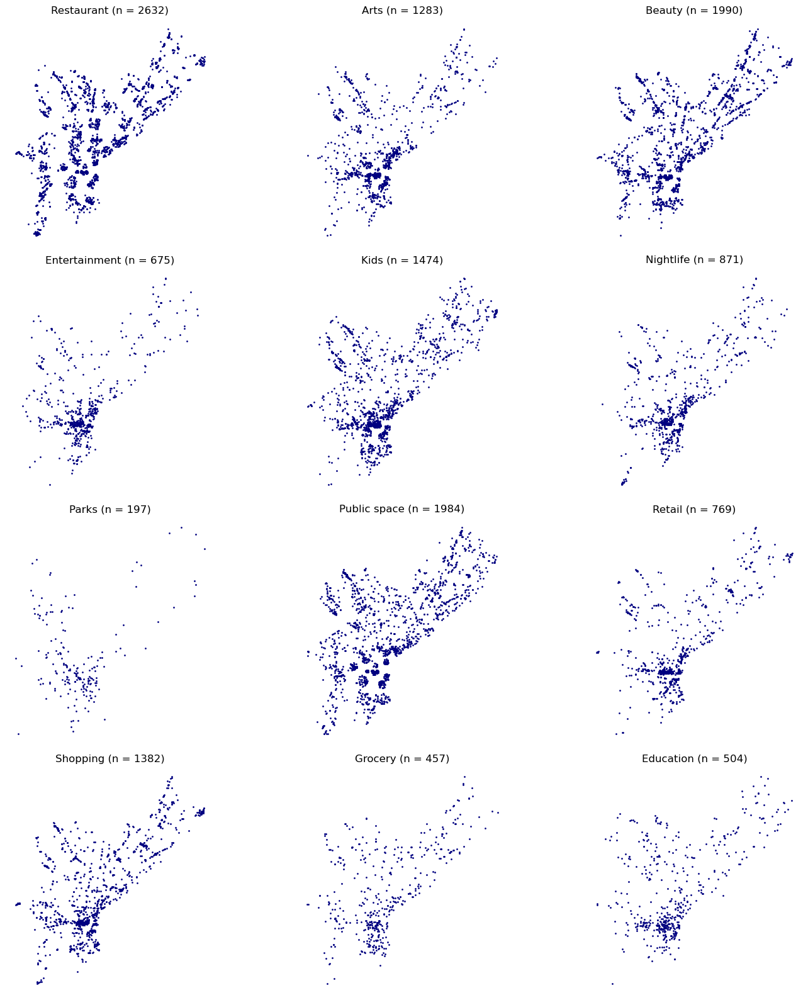

In [864]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Extract unique business types
business_types = amenities_phl_gdf['type'].unique()

# Determine the number of rows and columns for the subplots
n_rows = len(business_types) // 3 + (len(business_types) % 3 > 0)
fig, axes = plt.subplots(n_rows, 3, figsize=(15, n_rows * 4))

# Flatten the axes array for easy looping
axes = axes.flatten()

# Create a map for each business type
for i, business_type in enumerate(business_types):
    # Filter data for the current business type
    subset = amenities_phl_gdf[amenities_phl_gdf['type'] == business_type]

    # Get count for the current business type
    count = amenities_grouped[amenities_grouped['type'] == business_type]['count'].values[0]

    # Plotting with transparency
    subset.plot(ax=axes[i], color='navy', markersize=1, alpha=1)

    # Set title with count (n = count)
    axes[i].set_title(f"{business_type.capitalize()} (n = {count})")

    # Customizations: Remove boxes, axis ticks, and labels
    axes[i].set_axis_off()

# Remove unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()

# Display the panel of maps
plt.show()

In [865]:
amenities_phl_gdf["name"].nunique()

9088

# Data Validation

## Check duplicates

In [871]:
# Mark duplicates
duplicates = amenities_phl_gdf.duplicated(subset=['name', 'geometry'], keep=False)

# Create a DataFrame with only duplicates
duplicates_df = amenities_phl_gdf[duplicates]

duplicates_df[["name", "alias", "type"]].sort_values(by = "name").head(20)

,name,alias,type
3873,"""Your Move"" Sculpture",landmarks,arts
10181,"""Your Move"" Sculpture",landmarks,parks
15190,1 Stop,delis,grocery
11077,1 Stop,delis,public space
932,1 Stop,delis,restaurant
5057,10 For 10 Nails,othersalons,beauty
3102,10 For 10 Nails,othersalons,arts
9525,1100 Social,"bars, newamerican",nightlife
11708,1100 Social,"bars, newamerican",public space
1641,1100 Social,"bars, newamerican",restaurant


# Neighborhoods and amenities

In [872]:
amenities_neighborhood = gpd.sjoin(amenities_phl_gdf, tract, how = "left", predicate = "intersects")

In [873]:
amenities_neigh_group = amenities_neighborhood.groupby(["neighborhood_name", "type"]).size().reset_index(name='count')
amenities_neigh_group_gdf = amenities_neigh_group.merge(phl_tract_proj, how = "left", on = "neighborhood_name")

In [874]:
amenities_neigh = gpd.GeoDataFrame(amenities_neigh_group_gdf, geometry='geometry')

In [875]:
amenities_nb = amenities_neigh[["neighborhood_name", "type", "count", "geometry"]]

In [876]:
amenities_nb[amenities_nb["type"] == "parks"].explore(tiles='CartoDB dark_matter', legend=True, column = "count", cmap = "magma")

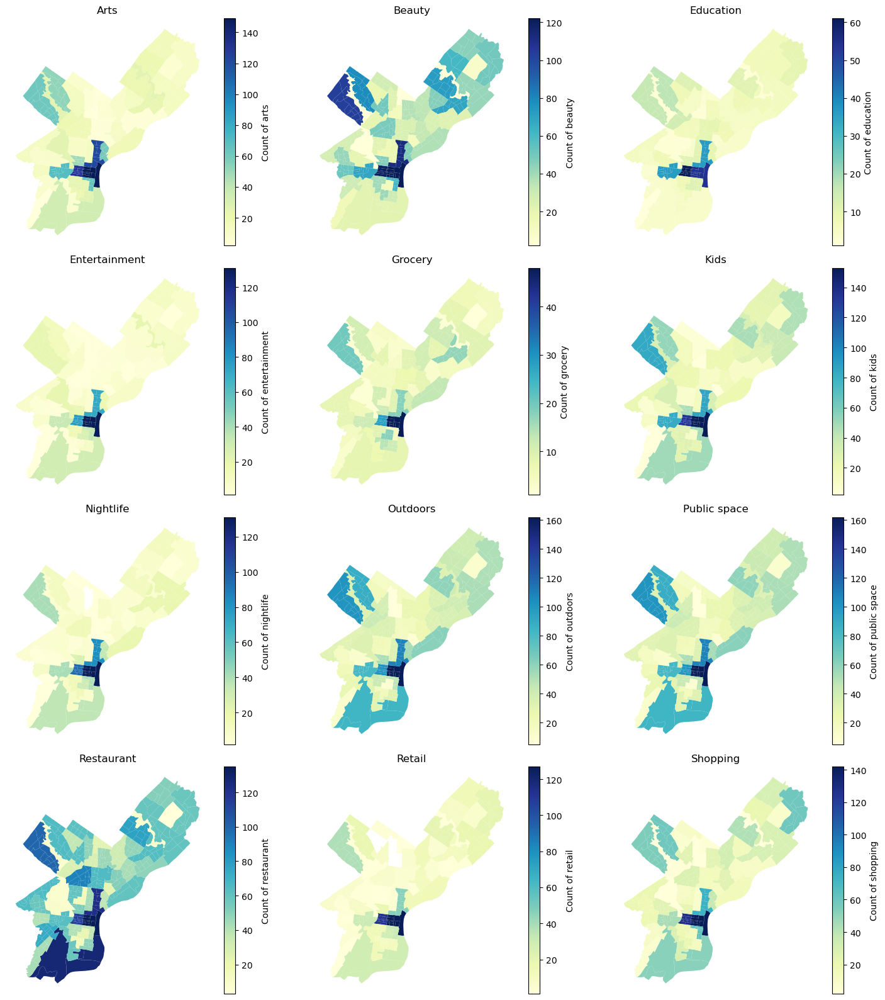

In [518]:
# Extract unique types
amenity_types = amenities_nb['type'].unique()

# Determine the number of rows and columns for the subplots
n_rows = len(amenity_types) // 3 + (len(amenity_types) % 3 > 0)
fig, axes = plt.subplots(n_rows, 3, figsize=(15, n_rows * 4))

# Flatten the axes array for easy looping
axes = axes.flatten()

# Create a choropleth map for each amenity type
for i, amenity_type in enumerate(amenity_types):
    # Filter data for the current amenity type
    subset = amenities_nb[amenities_nb['type'] == amenity_type]

    # Plotting
    subset.plot(column='count', ax=axes[i], legend=True,
                legend_kwds={'label': "Count of " + amenity_type},
                cmap='YlGnBu')

    # Set title
    axes[i].set_title(amenity_type.capitalize())
    
     # Remove boxes, axis ticks, and axis labels
    axes[i].set_axis_off()

# Remove unused subplots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()

# Display the panel of maps
plt.show()

# Correlation analysis

In [578]:
# spreading the data
amenities_nb_wide = amenities_nb.pivot_table(index='neighborhood_name', columns='type', values='count', aggfunc=np.mean).fillna(0)

type,arts,beauty,education,entertainment,grocery,kids,nightlife,outdoors,public space,restaurant,retail,shopping
neighborhood_name,,,,,,,,,,,,
Airport-Navy Yard,34.0,21.0,4.0,29.0,8.0,50.0,36.0,84.0,84.0,127.0,29.0,52.0
Bustleton,20.0,61.0,7.0,6.0,8.0,25.0,9.0,43.0,43.0,59.0,9.0,21.0
Center City East,149.0,122.0,54.0,131.0,48.0,153.0,131.0,162.0,162.0,135.0,127.0,142.0
Center City West,130.0,120.0,61.0,77.0,28.0,133.0,95.0,101.0,101.0,114.0,112.0,128.0
Chestnut Hill-West Mt. Airy,53.0,78.0,17.0,13.0,11.0,53.0,13.0,88.0,88.0,65.0,18.0,59.0
Cobbs Creek,14.0,52.0,3.0,7.0,8.0,13.0,11.0,21.0,21.0,41.0,2.0,19.0
East Falls-Westside,20.0,20.0,14.0,7.0,5.0,22.0,9.0,42.0,42.0,28.0,2.0,4.0
East Mt. Airy,14.0,18.0,8.0,4.0,3.0,16.0,4.0,20.0,20.0,37.0,0.0,7.0
Eastwick-Elmwood,2.0,15.0,1.0,1.0,3.0,3.0,2.0,12.0,12.0,43.0,1.0,7.0


In [490]:
# Calculating the correlation matrix
correlation_matrix = amenities_nb_wide.corr()

import altair as alt

# Reset index to convert the index into a column for Altair
heatmap_data = correlation_matrix.reset_index().melt('type', var_name='type2', value_name='correlation')

# Create the heatmap
heatmap = alt.Chart(heatmap_data).mark_rect().encode(
    x='type:N',
    y='type2:N',
    color='correlation:Q'
)

# Add text to each cell
text = heatmap.mark_text(baseline='middle').encode(
    text=alt.Text('correlation:Q', format='.2f'),
    color=alt.condition(
        alt.datum.correlation > 0.5, 
        alt.value('white'),
        alt.value('black')
    )
)

# Display the chart
chart = (heatmap + text).properties(width=600, height=600)
chart

alt.LayerChart(...)

- Most are > 0.7
- most collinear vars: shopping, retail, outdoors/public space, nightlife, kids, entertainment, arts

# Category validation
Done:
- restaurants
- parks
- education
- grocery
- nightlife
- arts

## Restaurants

In [718]:
# Filter and create a copy to avoid SettingWithCopyWarning
food_desc = amenities_phl_gdf[amenities_phl_gdf["type"] == "restaurant"].copy()

# Create a new column 'desc_1'
food_desc["desc_1"] = food_desc['alias'].str.split(',').str[0].str.strip().str.lower()
food_desc["desc_2"] = food_desc['alias'].str.split(',').str[1].str.strip().str.lower()
food_desc["desc_3"] = food_desc['alias'].str.split(',').str[2].str.strip().str.lower()


### First word in "alias"

In [719]:
# Group by 'desc_1' and count, then convert to DataFrame
food_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(10)

,desc_1,count
107,pizza,316
36,chinese,193
117,restaurants,179
45,delis,158
123,seafood,100
17,breakfast_brunch,86
99,newamerican,81
77,hotdogs,81
58,fooddeliveryservices,75
121,sandwiches,75


### Second word in "alias"

In [720]:
# Group by 'desc_2' and count, then convert to DataFrame
food_desc.groupby("desc_2").size().reset_index(name='count').sort_values("count", ascending = False).head(10)

,desc_2,count
111,sandwiches,117
12,breakfast_brunch,86
17,burgers,77
64,hotdogs,74
112,seafood,71
28,chicken_wings,64
131,tradamerican,64
72,italian,43
98,pizza,42
27,cheesesteaks,40


### Third word in "alias"

In [721]:
# Group by 'desc_3' and count, then convert to DataFrame
food_desc.groupby("desc_3").size().reset_index(name='count').sort_values("count", ascending = False).head(10)

,desc_3,count
80,sandwiches,122
94,tradamerican,59
20,chicken_wings,40
49,hotdogs,37
10,breakfast_brunch,36
13,burgers,33
25,coffee,30
81,seafood,26
31,delis,26
79,salad,22


### Replace description 1 with description 2 when description 1 is irrelevant
Words like "restaurant" and "fooddeliveryservices" don't tell us what kind of food is served. Let's replace the description in these cases with something more descriptive. 

In these cases we can search for restaurants where the first word isn't descriptive, then replace the desc_1 with desc_2.

In [723]:
# replace desc_2
condition1 = food_desc['desc_2'].isin(["food trucks", "foodtrucks", "fooddeliveryservices", "delis", "bars", "grocery", "pubs", "catering", "convenience", 
                                       "sportsbars", "popuprestaurants", "restaurants", "foodstands", "comfortfood", "food_court", "lounges", "breweries", 
                                       "wine_bars", "bowling", "meats", "newamerican", "tradamerican", "american", "buffets", "foodtrucks"])

condition2 = food_desc['desc_3'].notna()

# Update desc_1 where conditions are met
food_desc.loc[condition1 & condition2, 'desc_2'] = food_desc['desc_3']


# replace desc_1
condition1 = food_desc['desc_1'].isin(["food trucks", "foodtrucks", "fooddeliveryservices", "delis", "bars", "grocery", "pubs", "catering", "convenience", 
                                       "sportsbars", "popuprestaurants", "restaurants", "foodstands", "comfortfood", "food_court", "lounges", "breweries", 
                                       "wine_bars", "bowling", "meats", "newamerican", "tradamerican", "american", "buffets", "foodtrucks"])

condition2 = food_desc['desc_2'].notna()

# Update desc_1 where conditions are met
food_desc.loc[condition1 & condition2, 'desc_1'] = food_desc['desc_2']

food_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False)

,desc_1,count
109,pizza,335
37,chinese,198
122,restaurants,179
126,sandwiches,147
128,seafood,124
18,breakfast_brunch,110
47,delis,99
22,burgers,98
78,hotdogs,86
95,mexican,63


Unfortunately this didn't replace "restaurant". Restaurants with only "restaurants" as the first word in their alias usually don't have other descriptive words. This shows that "restaurant" is the default. This calls for another approach.

In [672]:
food_desc[food_desc["desc_1"] == "restaurants"].head(5)

,name,rating,address,alias,title,geometry,type,desc_1,desc_2,desc_3
8,Smitty's Restaurant,0.0,5405 Chester Ave,restaurants,Restaurants,POINT (2676904.285 231029.670),restaurant,restaurants,NaN,NaN
10,Kan Yuen Ping,0.0,5428 Chester Ave,restaurants,Restaurants,POINT (2676791.167 230669.291),restaurant,restaurants,NaN,NaN
11,Silver Place,0.0,1500 S 58th St,restaurants,Restaurants,POINT (2673976.157 231063.740),restaurant,restaurants,NaN,NaN
14,Yuan East Restaurant,0.0,1832 S 58th St,restaurants,Restaurants,POINT (2675345.361 229583.321),restaurant,restaurants,NaN,NaN
17,Wei Hua,0.0,5140 Chester Ave,restaurants,Restaurants,POINT (2677863.415 231724.048),restaurant,restaurants,NaN,NaN


By inspecting the names of restaurants lacking descriptions, we can parse out some common categories. 

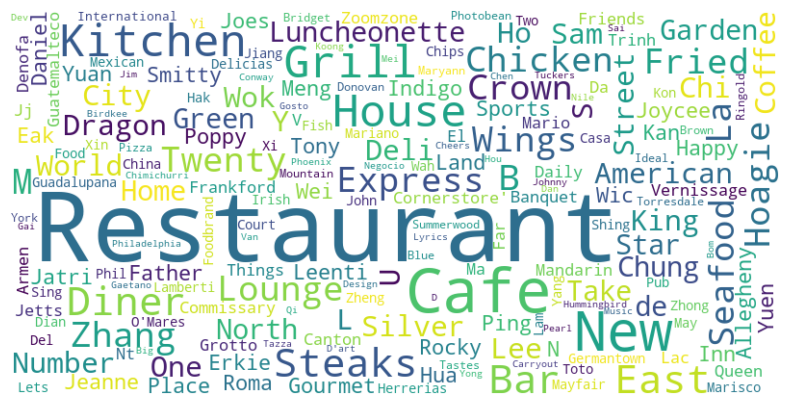

In [725]:
restaurant_cloud = food_desc[food_desc["desc_1"] == "restaurants"]

# Concatenate all text in the column
text = ' '.join(restaurant_cloud['name'].dropna())

# Create the word cloud
wordcloud = WordCloud(width=800, height=400, background_color ='white').generate(text)

# Display the word cloud using matplotlib
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [727]:
# Define the mapping
keyword_mapping = {
    'yuen': 'chinese',
    'ping': 'chinese',
    'zhong': 'chinese',
    'china': 'chinese',
    'canton': 'chinese',
    'wok': 'chinese',
    'lee': 'chinese',
    'china': 'chinese',
    'zhang': 'chinese',
    'chung': 'chinese',
    'dragon': 'chinese',
    'meng': 'chinese',
    'xin': 'chinese',
    'hua': 'chinese',
    'ping': 'chinese',
    'hua': 'chinese',
    'meng': 'chinese',
    'yi': 'chinese',
    'xi': 'chinese',
    'lam': 'chinese',
    'zhang': 'chinese',
    'wei': 'chinese',
    'salad': 'salad',
    'pizza': 'pizza',
    'grill': 'grill',
    "steak": "grill",
    'sushi': 'japanese',
    'chicken': 'chicken',
    'pizzeria': 'pizza',
    'pizza': 'pizza',
    'bbg': 'bbq',
    'hoagie': 'sandwich',
    'steaks': 'sandwich',
    'coffee': 'cafe', 
    'cafe': 'cafe',
    'diner': 'american',
    'luncheonette': 'american',
    'wings': 'wings',
    'deli': 'deli',
    'mexican': 'latin',
    'guadalupana': 'latin',
    'guatamelteco': 'latin',
    'fish': 'seafood',
    'casa': 'latin'}

# Function to find the keyword and return the corresponding desc_2 value
def map_keyword_to_desc(name, mapping):
    for keyword, desc in mapping.items():
        if re.search(re.escape(keyword), name, re.IGNORECASE):
            return desc
    return None

# Define the list of specific values
specific_values = ["food trucks", "fooddeliveryservices", "bars", "grocery", "restaurants"]

# Define the combined condition: desc_2 is NA or in the list of specific values
condition_combined = food_desc['desc_2'].isna() | food_desc['desc_1'].isin(specific_values)

# Apply the function to update desc_2 based on the combined condition
food_desc.loc[condition_combined, 'desc_1'] = food_desc.loc[condition_combined, 'name'].apply(lambda x: map_keyword_to_desc(x, keyword_mapping))

## Reformat into larger categories

In [762]:
# Define the mapping dictionary
desc_mapping = {
    "burgers": "sandwiches",
    "hotdogs": "sandwiches",
    "chicken_wings": "chicken",
    "tradamerican": "american",
    "newamerican": "american",
    "wings": "chicken",
    "hotdog": "diner/grill",
    "gastropubs": "diner/grill",
    "diners": "diner/grill",
    "steak": "diner/grill",
    "grills": "diner/grill",
    "grill": "diner/grill",
    "coffee": "bakeries/cafes",
    'cafe': "bakeries/cafes",
    "cafes": "bakeries/cafes",
    'bagels': "bakeries/cafes",
    'wraps': "bakeries/cafes",
    'soups': "bakeries/cafes",
    'soup': "bakeries/cafes",
    "cupcakes": "bakeries/cafes",
    "creperies": "bakeries/cafes",
    "bakeries": "bakeries/cafes",
    "juicebars": "bakeries/cafes",
    'donuts': "bakeries/cafes",
    'icecream': "bakeries/cafes",
    "ice cream": 'bakeries/cafes',
    "desserts": "bakeries/cafes",
    "waffles": "bakeries/cafes",
    "cakeshop": "bakeries/cafes",
    'customcakes': 'bakeries/cafes',
    "cheesesteaks": "sandwiches/delis",
    "sandwich": "sandwiches/delis",
    "sandwiches": "sandwiches/delis",
    "delis": "sandwiches/delis",
    "deli": "sandwiches/delis",
    "chickenshop": "chicken",
    "sushi": "japanese",
    "ramen": "japanese",
    'hotpot': 'chinese',
    "szechuan": "chinese",
    "cantonese": "chinese",
    "dimsum": "chinese",
    "shanghainese": "chinese",
    "pretzels": "bakeries/cafes",
    "mexican": "latin",
    "honduran": "latin",
    "nicaraguan": "latin",
    "spanish": "latin",
    "guatemalan": "latin",
    "tacos": "latin",
    "brazilian": "latin",
    "portuguese": "latin",
    "dominican": "caribbean",
    "haitian": "caribbean",
    "seafoodmarket,": "seafood",
    "seafoodmarkets,": "seafood",
    "greek": "mediterranean",
    "mideastern": "halal"
}

# Replace desc_1 values using the mapping dictionary
food_desc['desc_1'] = food_desc['desc_1'].replace(desc_mapping)

In [763]:
food_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False)

,desc_1,count
21,other,728
22,pizza,323
26,sandwiches/delis,297
2,bakeries/cafes,218
8,chinese,158
12,fastfood,154
27,seafood,91
11,diner/grill,76
4,breakfast_brunch,76
7,chicken,68


### Identify fast food/chain restaurants
Override desc_1 with "fastfood" for major chain restaurants.

In [767]:
food_desc.groupby("name").size().sort_values(ascending = False).head(10)

name
Wawa                         26
McDonald's                   25
Popeyes Louisiana Kitchen    18
Wendy's                      15
Philly Pretzel Factory       13
KFC                          12
Subway                       10
Crown Fried Chicken           8
Burger King                   8
China House                   8
dtype: int64

In [757]:
fast_food = [
    "McDonald's",
    "Wawa", 
    "Wingstop",
    "MrBeast Burger",
    "Chick-fil-A",
    "Chipotle Mexican Grill",
    "Checkers",
    "Wendy's",
    "Subway",
    "Popeyes Louisiana Kitchen",
    "Taco Bell",
    "KFC",
    "Burger King",
]

In [758]:
food_desc.loc[food_desc["name"].isin(fast_food), "desc_1"] = "fastfood"

Take the descriptions with frequency < 6 and replace the string with the second term in alias

In [787]:
desc_counts = food_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False)

# Filter for 'desc_1' values where count is less than 6
desc_less_than_six = desc_counts[desc_counts['count'] < 6]['desc_1']

# Convert the filtered results to a list
desc_list = desc_less_than_six.tolist()

# replace desc_1 with desc_2 where desc_1 is in the list of descriptions with frequency < 6
food_desc.loc[food_desc['desc_1'].isin(desc_list), 'desc_1'] = food_desc['desc_2']

Take descriptions with frequency < 10 and replace with "other"

In [788]:
# Filter for 'desc_1' values where count is less than 10
desc_less_than_ten = desc_counts[desc_counts['count'] < 10]['desc_1']

# Convert the filtered results to a list
desc_list = desc_less_than_ten.tolist()

food_desc['desc_1'] = food_desc['desc_1'].apply(lambda x: desc_mapping[x] if x in desc_mapping else x)

# Replace desc_1 with desc_2 where desc_1 is in the list of descriptions with frequency < 10
food_desc.loc[food_desc['desc_1'].isin(desc_list) | (food_desc['desc_1'] == "restaurants") | (food_desc['desc_1'].isna()), 'desc_1'] = "other"


In [789]:
food_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False)

,desc_1,count
17,other,735
18,pizza,323
20,sandwiches/delis,297
2,bakeries/cafes,218
7,chinese,158
10,fastfood,154
21,seafood,91
4,breakfast_brunch,76
9,diner/grill,76
6,chicken,68


## Parks

In [931]:
# Filter and create a copy to avoid SettingWithCopyWarning
parks_desc = amenities_phl_gdf[amenities_phl_gdf["type"] == "parks"].copy()

# Create a new column 'desc_1'
parks_desc["desc_1"] = parks_desc['alias'].str.split(',').str[0].str.strip().str.lower()
parks_desc["desc_2"] = parks_desc['alias'].str.split(',').str[1].str.strip().str.lower()
parks_desc["desc_3"] = parks_desc['alias'].str.split(',').str[2].str.strip().str.lower()

### First word in 'alias'

In [932]:
# Group by 'desc_1' and count, then convert to DataFrame
parks_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(100)

,desc_1,count
12,parks,90
8,landmarks,31
14,playgrounds,17
2,dog_parks,14
17,recreation,8
6,hiking,7
5,gardens,5
18,skate_parks,5
4,football,3
11,nonprofit,2


### Filter for categories where frequency ≥ 5

In [933]:
park_desc_1 = parks_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(9)
top_park_desc = list(park_desc_1["desc_1"])
# remove historical landmarks
top_park_desc.remove('landmarks')

# filter for obs in the list of top descriptions
parks_desc = parks_desc[parks_desc["desc_1"].isin(top_park_desc)]
parks_desc.head(10)

,name,rating,address,alias,title,geometry,type,desc_1,desc_2,desc_3
9915,Cedar Park,4.5,50th St & Baltimore Ave,parks,Parks,POINT (2677006.643 234133.514),parks,parks,NaN,NaN
9916,Chester Avenue Dog Park,3.5,801 S 48th St,dog_parks,Dog Parks,POINT (2678024.964 234174.704),parks,dog_parks,NaN,NaN
9917,Malcolm X Park,4.0,51ST And Pine St,parks,Parks,POINT (2676187.013 235721.062),parks,parks,NaN,NaN
9918,Barkan Park,3.0,4936 Spruce St,"parks, playgrounds","Parks, Playgrounds",POINT (2677109.530 236278.545),parks,parks,playgrounds,NaN
9919,Clark Park Dog Bowl,4.5,43rd & Chester,dog_parks,Dog Parks,POINT (2680815.785 234312.734),parks,dog_parks,NaN,NaN
9920,Clark Park,4.5,43RD And Baltimore,parks,Parks,POINT (2680756.007 234729.865),parks,parks,NaN,NaN
9921,Greys Ferry Cresent Skatepark,5.0,3600 Grays Ferry Ave,skate_parks,Skate Parks,POINT (2683004.637 231400.562),parks,skate_parks,NaN,NaN
9922,Grays Ferry Crescent,4.0,,parks,Parks,POINT (2682813.782 232182.835),parks,parks,NaN,NaN
9923,Lanier Dog Park,4.0,2911 Tasker St,dog_parks,Dog Parks,POINT (2685221.027 229056.524),parks,dog_parks,NaN,NaN
9924,Saunder's Green,3.5,300-50 Saunders Ave,parks,Parks,POINT (2683400.920 238616.685),parks,parks,NaN,NaN


## Education

In [943]:
# Filter and create a copy to avoid SettingWithCopyWarning
edu_desc = amenities_phl_gdf[amenities_phl_gdf["type"] == "education"].copy()

# Create a new column 'desc_1'
edu_desc["desc_1"] = edu_desc['alias'].str.split(',').str[0].str.strip().str.lower()
edu_desc["desc_2"] = edu_desc['alias'].str.split(',').str[1].str.strip().str.lower()
edu_desc["desc_3"] = edu_desc['alias'].str.split(',').str[2].str.strip().str.lower()

### First word in alias

In [944]:
# Group by 'desc_1' and count, then convert to DataFrame
edu_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(20)

,desc_1,count
11,childcare,61
25,elementaryschools,50
61,preschools,47
13,collegeuniv,43
38,highschools,27
69,specialtyschools,19
24,educationservices,17
22,driving_schools,17
73,theater,14
6,artschools,13


### Filter for frequency ≥ 6

In [947]:
edu_desc_1 = edu_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(18)
top_edu_desc = list(edu_desc_1["desc_1"])
# remove historical landmarks
top_edu_desc.remove('theater')

# filter for obs in the list of top descriptions
edu_desc_1 = edu_desc[edu_desc["desc_1"].isin(top_edu_desc)]
edu_desc.head(10)

,name,rating,address,alias,title,geometry,type,desc_1,desc_2,desc_3
15486,BellyWise,5.0,NaN,"midwives, specialtyschools","Midwives, Specialty Schools",POINT (2676169.939 231988.984),education,midwives,specialtyschools,NaN
15487,Limitless CPR,5.0,NaN,cprclasses,CPR Classes,POINT (2677042.522 231394.414),education,cprclasses,NaN,NaN
15488,Michele Judge,5.0,4919 Pentridge St,"jewelryrepair, artclasses, jewelry","Jewelry Repair, Art Classes, Jewelry",POINT (2677304.635 233898.273),education,jewelryrepair,artclasses,jewelry
15489,Kipp West Philadelphia Prep Charter,1.0,5900 Baltimore Ave,specialed,Special Education,POINT (2671666.162 232636.864),education,specialed,NaN,NaN
15490,Beulah Baptist Christian Day School,2.0,5001 Spruce St,"elementaryschools, preschools","Elementary Schools, Preschools",POINT (2677065.563 236331.076),education,elementaryschools,preschools,NaN
15491,The Academy of Industrial Arts,5.0,6328 Paschall Ave,"vocation, electricians","Vocational & Technical School, Electricians",POINT (2674851.743 225884.662),education,vocation,electricians,NaN
15492,TYLII,3.0,5124 Walnut St,"preschools, childcare","Preschools, Child Care & Day Care",POINT (2676415.568 237130.841),education,preschools,childcare,NaN
15493,University of the Sciences,3.0,600 S 43rd St,collegeuniv,Colleges & Universities,POINT (2681062.408 233555.127),education,collegeuniv,NaN,NaN
15494,All Around This World,5.0,4336 Pine St,educationservices,Educational Services,POINT (2680347.395 235381.376),education,educationservices,NaN,NaN
15495,Jubilee School,3.0,4211 Chester Ave,highschools,Middle Schools & High Schools,POINT (2681043.809 234475.721),education,highschools,NaN,NaN


## Grocery

In [949]:
# Filter and create a copy to avoid SettingWithCopyWarning
grocery_desc = amenities_phl_gdf[amenities_phl_gdf["type"] == "grocery"].copy()

# Create a new column 'desc_1'
grocery_desc["desc_1"] = grocery_desc['alias'].str.split(',').str[0].str.strip().str.lower()
grocery_desc["desc_2"] = grocery_desc['alias'].str.split(',').str[1].str.strip().str.lower()
grocery_desc["desc_3"] = grocery_desc['alias'].str.split(',').str[2].str.strip().str.lower()

In [951]:
grocery_desc.head()

,name,rating,address,alias,title,geometry,type,desc_1,desc_2,desc_3
14871,Kim A Grocery & Deli,1.0,1840 S 58th St,grocery,Grocery,POINT (2675396.135 229529.164),grocery,grocery,NaN,NaN
14872,S and J Seafood,4.0,713 S 52nd St,"seafoodmarkets, grocery","Seafood Markets, Grocery",POINT (2675793.250 234207.384),grocery,seafoodmarkets,grocery,NaN
14873,Mariposa Food Co-op,4.0,4824 Baltimore Ave,"grocery, healthmarkets","Grocery, Health Markets",POINT (2677563.153 234052.277),grocery,grocery,healthmarkets,NaN
14874,Jennifer Grocery,2.5,4824 Chester Ave,"grocery, convenience","Grocery, Convenience Stores",POINT (2678754.671 232771.760),grocery,grocery,convenience,NaN
14875,Fu-Wah Mini Market,4.5,810 S 47th St,"convenience, sandwiches, grocery","Convenience Stores, Sandwiches, Grocery",POINT (2678571.989 234207.924),grocery,convenience,sandwiches,grocery


## Nightlife

In [952]:
# Filter and create a copy to avoid SettingWithCopyWarning
night_desc = amenities_phl_gdf[amenities_phl_gdf["type"] == "nightlife"].copy()

# Create a new column 'desc_1'
night_desc["desc_1"] = night_desc['alias'].str.split(',').str[0].str.strip().str.lower()
night_desc["desc_2"] = night_desc['alias'].str.split(',').str[1].str.strip().str.lower()
night_desc["desc_3"] = night_desc['alias'].str.split(',').str[2].str.strip().str.lower()

In [954]:
night_desc.head()

,name,rating,address,alias,title,geometry,type,desc_1,desc_2,desc_3
8877,Pentridge Station Beer Garden,4.5,5116 Pentridge St,beergardens,Beer Gardens,POINT (2676581.781 233167.788),nightlife,beergardens,NaN,NaN
8878,720 Bistro,4.0,720 S.52nd st,"seafood, breakfast_brunch, cocktailbars","Seafood, Breakfast & Brunch, Cocktail Bars",POINT (2675620.054 234102.746),nightlife,seafood,breakfast_brunch,cocktailbars
8879,Bayou,4.5,5025 Baltimore Ave,lounges,Lounges,POINT (2676525.799 234061.840),nightlife,lounges,NaN,NaN
8880,Booker's Restaurant and Bar,3.5,5021 Baltimore Ave,"bars, breakfast_brunch, tradamerican","Bars, Breakfast & Brunch, American",POINT (2676559.222 234070.085),nightlife,bars,breakfast_brunch,tradamerican
8881,The Wine Garden,4.5,5019 Baltimore Ave,wine_bars,Wine Bars,POINT (2676563.551 234060.148),nightlife,wine_bars,NaN,NaN


### Alias

In [955]:
# Group by 'desc_1' and count, then convert to DataFrame
night_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(10)

,desc_1,count
6,bars,147
73,pubs,58
84,sportsbars,57
33,divebars,44
65,newamerican,42
59,lounges,41
22,cocktailbars,36
97,tradamerican,35
45,hookah_bars,26
28,danceclubs,25


In [956]:
# Group by 'desc_2' and count, then convert to DataFrame
night_desc.groupby("desc_2").size().reset_index(name='count').sort_values("count", ascending = False).head(10)

,desc_2,count
6,bars,76
99,tradamerican,46
24,cocktailbars,39
89,sportsbars,37
66,newamerican,33
59,lounges,26
83,seafood,23
65,musicvenues,22
77,pubs,18
13,breakfast_brunch,16


In [957]:
# Group by 'desc_3' and count, then convert to DataFrame
night_desc.groupby("desc_3").size().reset_index(name='count').sort_values("count", ascending = False).head(10)

,desc_3,count
17,cocktailbars,44
68,tradamerican,30
3,bars,20
8,breakfast_brunch,19
6,beerbar,17
70,venues,15
10,burgers,12
60,sportsbars,12
54,sandwiches,12
47,newamerican,10


### Replace desc_1 with more relevant alias terms

In [974]:
# replace desc_2
condition1 = night_desc['desc_2'].isin(["newamerican", "seafood", "breakfast_brunch", "tradamerican", "burgers", "sandwiches", "pizza", "mexican", "italian",
                                       "french", "ramen", "tapasmallplates", "french", "ramen", "mideastern", "comfortfood", "steak", "mediterranean", "caribbean",
                                       "bbq", "peruvian", "japanese", "ethiopian", "tex-mex", "southern", "juicebars", "cajun", "soulfood", "portugeuse", "sushi",
                                       "vegan", "cafes", "diners", "chicken-wings", "chinese", "salad", "cheesesteaks", "african", "german", "desserts", "indpak",
                                       "thai", "tacos", "falafel", "vietnamese", "waffles", "delis", "coffee", "korean", "hotdog", "moroccan", "newmexican", "cuban",
                                       "argentine", "gluten_free", "russian", "bakeries", "portuguese", "spanish", "latin", "catering", "gastropubs", 
                                       "breweries", "gaybars", "whiskeybars", "tikibars", "tobaccoshops", "beer_and_wine", "breweries", "venues",
                                       "poolhalls", "jazzandblues", "airportlounges", "cigarbars", "speakeasies", "theater", "nightlife"])

condition2 = night_desc['desc_3'].notna()

# Update desc_1 where conditions are met
night_desc.loc[condition1 & condition2, 'desc_2'] = night_desc['desc_3']


# replace desc_1
condition1 = night_desc['desc_1'].isin(["newamerican", "seafood", "breakfast_brunch", "tradamerican", "burgers", "sandwiches", "pizza", "mexican", "italian",
                                       "french", "ramen", "tapasmallplates", "french", "ramen", "mideastern", "comfortfood", "steak", "mediterranean", "caribbean",
                                       "bbq", "peruvian", "japanese", "ethiopian", "tex-mex", "southern", "juicebars", "cajun", "soulfood", "portugeuse", "sushi",
                                       "vegan", "cafes", "diners", "chicken-wings", "chinese", "salad", "cheesesteaks", "african", "german", "desserts", "indpak",
                                       "thai", "tacos", "falafel", "vietnamese", "waffles", "delis", "coffee", "korean", "hotdog", "moroccan", "newmexican", "cuban",
                                       "argentine", "gluten_free", "russian", "bakeries", "portuguese", "spanish", "latin", "catering", "gastropubs", 
                                       "breweries", "gaybars", "whiskeybars", "tikibars", "tobaccoshops", "beer_and_wine", "breweries", "venues",
                                       "poolhalls", "jazzandblues", "airportlounges", "cigarbars", "speakeasies", "theater", "nightlife"])

condition2 = night_desc['desc_2'].notna()

# Update desc_1 where conditions are met
night_desc.loc[condition1 & condition2, 'desc_1'] = night_desc['desc_2']

night_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(15)

,desc_1,count
4,bars,228
11,cocktailbars,95
48,sportsbars,85
43,pubs,69
37,lounges,55
19,divebars,49
6,beerbar,39
56,wine_bars,38
38,musicvenues,36
29,hookah_bars,33


In [ ]:
### Filter for categories where frequency ≥ 8

In [975]:
night_desc_1 = night_desc.groupby("desc_1").size().reset_index(name='count').sort_values("count", ascending = False).head(9)
top_night_desc = list(night_desc_1["desc_1"])

# filter for obs in the list of top descriptions
night_desc = night_desc[night_desc["desc_1"].isin(top_night_desc)]
night_desc.head(10)

,name,rating,address,alias,title,geometry,type,desc_1,desc_2,desc_3
8878,720 Bistro,4.0,720 S.52nd st,"seafood, breakfast_brunch, cocktailbars","Seafood, Breakfast & Brunch, Cocktail Bars",POINT (2675620.054 234102.746),nightlife,cocktailbars,cocktailbars,cocktailbars
8879,Bayou,4.5,5025 Baltimore Ave,lounges,Lounges,POINT (2676525.799 234061.840),nightlife,lounges,NaN,NaN
8880,Booker's Restaurant and Bar,3.5,5021 Baltimore Ave,"bars, breakfast_brunch, tradamerican","Bars, Breakfast & Brunch, American",POINT (2676559.222 234070.085),nightlife,bars,tradamerican,tradamerican
8881,The Wine Garden,4.5,5019 Baltimore Ave,wine_bars,Wine Bars,POINT (2676563.551 234060.148),nightlife,wine_bars,NaN,NaN
8882,Carbon Copy,4.5,701 S 50th St,"breweries, pizza, bars","Breweries, Pizza, Bars",POINT (2676997.957 233927.765),nightlife,bars,bars,bars
8883,Dock Street Cannery and Tasting Room,4.0,705 S 50th St,"beerbar, lounges","Beer Bar, Lounges",POINT (2677046.168 233912.738),nightlife,beerbar,lounges,NaN
8884,Trendsetters Bar & Lounge,3.5,5301 Woodland Ave,"burgers, lounges, wraps","Burgers, Lounges, Wraps",POINT (2678439.957 230236.502),nightlife,lounges,lounges,wraps
8885,The Barn,3.5,4901 Catharine St,"poolhalls, sportsbars, divebars","Pool Halls, Sports Bars, Dive Bars",POINT (2677365.738 234212.623),nightlife,sportsbars,sportsbars,divebars
8886,Eris Temple,4.0,602 S 52nd St,musicvenues,Music Venues,POINT (2675702.055 234852.608),nightlife,musicvenues,NaN,NaN
8887,Dahlak,3.5,4708 Baltimore Ave,"ethiopian, divebars","Ethiopian, Dive Bars",POINT (2678487.076 234234.642),nightlife,divebars,divebars,NaN


## Arts

In [1021]:
# Filter and create a copy to avoid SettingWithCopyWarning
arts_desc = amenities_phl_gdf[amenities_phl_gdf["type"] == "arts"].copy()

# Create a new column 'desc_1'
arts_desc["desc_1"] = arts_desc['alias'].str.split(',').str[0].str.strip().str.lower()
arts_desc["desc_2"] = arts_desc['alias'].str.split(',').str[1].str.strip().str.lower()
arts_desc["desc_3"] = arts_desc['alias'].str.split(',').str[2].str.strip().str.lower()

In [1024]:
arts_desc.head(20)

,name,rating,address,alias,title,geometry,type,desc_1,desc_2,desc_3
2697,Mango & August Real Estate,5.0,5601 Chester Ave,realestatesvcs,Real Estate Services,POINT (2676184.185 230344.433),arts,realestatesvcs,NaN,NaN
2698,G Casamera Hair Salon & Day Spa,4.5,901 S 55th St,hair,Hair Salons,POINT (2674401.738 233069.721),arts,hair,NaN,NaN
2699,Heather McBride Photography,5.0,NaN,"sessionphotography, eventphotography","Session Photography, Event Photography",POINT (2676083.284 232370.887),arts,sessionphotography,eventphotography,NaN
2700,Thrive Fitness and Wellness,5.0,,"healthtrainers, bootcamps","Trainers, Boot Camps",POINT (2678175.872 231641.240),arts,healthtrainers,bootcamps,NaN
2701,BellyWise,5.0,NaN,"midwives, specialtyschools","Midwives, Specialty Schools",POINT (2676169.939 231988.984),arts,midwives,specialtyschools,NaN
2702,Ceramic Concept,5.0,5015 Baltimore Ave,galleries,Art Galleries,POINT (2676620.711 234054.592),arts,galleries,NaN,NaN
2703,Snapdragon Flowers,5.0,5015 Baltimore Ave,"florists, floraldesigners","Florists, Floral Designers",POINT (2676615.067 234078.935),arts,florists,floraldesigners,NaN
2704,VIX Emporium,4.5,5009 Baltimore Ave,"artsandcrafts, childcloth, jewelry","Arts & Crafts, Children's Clothing, Jewelry",POINT (2676676.410 234091.659),arts,artsandcrafts,childcloth,jewelry
2705,Carbon Copy,4.5,701 S 50th St,"breweries, pizza, bars","Breweries, Pizza, Bars",POINT (2676997.957 233927.765),arts,breweries,pizza,bars
2706,Michele Judge,5.0,4919 Pentridge St,"jewelryrepair, artclasses, jewelry","Jewelry Repair, Art Classes, Jewelry",POINT (2677304.635 233898.273),arts,jewelryrepair,artclasses,jewelry


# Cluster analysis

In [828]:
from sklearn.preprocessing import MinMaxScaler, RobustScaler
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

## Overall (all features)

In [913]:
kmeans = KMeans(n_clusters=5, random_state=42, n_init=10)

In [914]:
amenities_nb_wide = amenities_nb.pivot_table(index='neighborhood_name', columns='type', values='count', fill_value=0).reset_index()

In [915]:
amenities_nb_scaled = scaler.fit_transform(amenities_nb_wide[['restaurant', 'education', 'shopping', 'grocery', 'parks']])

In [916]:
amenities_nb_scaled[:5]

array([[ 2.52982693e+00, -5.30158962e-01,  8.54403925e-01,
        -1.74342324e-01, -3.21130313e-03],
       [ 1.82463151e-01, -2.77128548e-01, -2.58666025e-01,
        -1.74342324e-01, -6.32626716e-01],
       [ 2.80598738e+00,  3.68701460e+00,  4.08589733e+00,
         5.08274931e+00,  3.77328117e+00],
       [ 2.08106621e+00,  4.27741890e+00,  3.58322058e+00,
         2.45420349e+00,  2.51445035e+00],
       [ 3.89583485e-01,  5.66306164e-01,  1.10574230e+00,
         2.19939548e-01,  1.54142550e-01]])

In [917]:
amenities_nb_scaled.mean(axis=0)

array([-4.58816658e-17, -8.38331672e-17, -1.13288064e-17, -2.71891353e-17,
        3.96508223e-17])

In [918]:
amenities_nb_scaled.std(axis=0)

array([1., 1., 1., 1., 1.])

In [919]:
# Perform the fit
kmeans.fit(amenities_nb_scaled)

# Extract the labels
amenities_nb_wide['label'] = kmeans.labels_

In [920]:
(
    alt.Chart(amenities_nb_wide)
    .mark_circle()
    .encode(
        alt.X("restaurant:Q", scale=alt.Scale(type="log")),
        alt.Y("education:Q", scale=alt.Scale(zero=False)),
        size="shopping:Q",
        color=alt.Color("label:N", scale=alt.Scale(scheme="dark2")),
        tooltip=list(amenities_nb_wide.columns),
    )
    .properties(width=800, height=600)
    .interactive()
)

alt.Chart(...)

In [921]:
amenities_nb_wide.groupby("label").size()

label
0    29
1     2
2     4
3     1
4    13
dtype: int64

In [922]:
# Average restaurants per cluster
amenities_nb_wide.groupby("label")['restaurant'].mean().sort_values()

label
3      8.000000
4     28.461538
0     54.965517
2    102.750000
1    124.500000
Name: restaurant, dtype: float64

In [924]:
# Average educational institutions per cluster
amenities_nb_wide.groupby("label")['parks'].mean().sort_values()

label
4     0.615385
0     2.586207
2     9.500000
1    24.000000
3    28.000000
Name: parks, dtype: float64

In [925]:
amenities_nb_wide.loc[amenities_nb_wide['label']==2]

type,neighborhood_name,arts,beauty,education,entertainment,grocery,kids,nightlife,parks,public space,restaurant,retail,shopping,label
0,Airport-Navy Yard,34,21,4,29,8,50,36,4,84,127,29,52,2
23,Northern Liberties-West Kensington,121,113,36,72,18,86,83,10,109,122,46,74,2
35,Roxborough-Manayunk,62,103,16,20,20,84,41,14,101,99,38,55,2
45,University City,70,69,36,33,12,83,41,10,82,63,31,45,2


In [926]:
amenities_clusters = amenities_nb_wide.merge(tract, how = "left", on = "neighborhood_name")
amenities_clusters_gdf = gpd.GeoDataFrame(amenities_clusters, geometry = "geometry")

In [927]:
amenities_clusters_gdf.explore(
    column="label",
    cmap="Set3",
    categorical=True,
    legend=True,
    tiles="CartoDB positron"
)

## Restaurants

In [856]:
restaurant = food_desc[["name", "desc_1"]]
nb_gdf = amenities_neighborhood[["neighborhood_name", "name", "rating"]]

restaurants_nb_gdf = restaurant.merge(nb_gdf, on = "name", how = "left")

In [792]:
restaurants_nb_grouped = restaurants_nb_gdf.groupby(["neighborhood_name", "desc_1"]).size().reset_index(name="count")

# Sort within each neighborhood group by count in descending order
restaurants_nb_grouped = restaurants_nb_grouped.sort_values(by=["neighborhood_name", "count"], ascending=[True, False])
restaurants_nb_grouped.head()

,neighborhood_name,desc_1,count
8,Airport-Navy Yard,fastfood,110
13,Airport-Navy Yard,other,59
2,Airport-Navy Yard,bakeries/cafes,52
16,Airport-Navy Yard,sandwiches/delis,29
0,Airport-Navy Yard,american,21


In [793]:
restaurants_nb_wide = restaurants_nb_grouped.pivot_table(index='neighborhood_name', columns='desc_1', aggfunc='size', fill_value=0)

# Calculating the correlation matrix
correlation_matrix = restaurants_nb_wide.corr()

import altair as alt

# Reset index to convert the index into a column for Altair
heatmap_data = correlation_matrix.reset_index().melt('desc_1', var_name='desc_2', value_name='correlation')

In [794]:
heatmap_data.loc[heatmap_data['desc_1'] != heatmap_data['desc_2']].sort_values(ascending = False, by = "correlation").head(30)

,desc_1,desc_2,correlation
50,venues,asianfusion,0.710355
625,asianfusion,venues,0.710355
72,sandwiches/delis,bakeries/cafes,0.644928
522,bakeries/cafes,sandwiches/delis,0.644928
439,thai,mediterranean,0.533002
614,mediterranean,thai,0.533002
632,cocktailbars,venues,0.503452
232,venues,cocktailbars,0.503452
192,fastfood,chinese,0.465937
267,chinese,fastfood,0.465937


In [795]:
# Create the heatmap
heatmap = alt.Chart(heatmap_data).mark_rect().encode(
    x='desc_1:N',
    y='desc_2:N',
    color='correlation:Q'
)

# Add text to each cell
text = heatmap.mark_text(baseline='middle').encode(
    text=alt.Text('correlation:Q', format='.2f'),
    color=alt.condition(
        alt.datum.correlation > 0.5, 
        alt.value('white'),
        alt.value('black')
    )
)

# Display the chart
chart = (heatmap + text).properties(width=1000, height=1000)
chart

alt.LayerChart(...)

In [796]:
#restaurants_nb_wide = restaurants_nb_grouped.pivot(index='neighborhood_name', columns='desc_1', values='count')

# Reset the index if you want 'neighborhood_name' as a column
#restaurants_nb_wide.reset_index(inplace=True)

# Fill NaN values with 0 or another appropriate value if needed
#restaurants_nb_wide.fillna(0, inplace=True)


restaurants_nb_scaled = scaler.fit_transform(restaurants_nb_wide[['asianfusion', 'bakeries/cafes', 'bbq', 
                                                                  'breakfast_brunch', "caribbean", "chicken", 
                                                                  "chinese",  "diner/grill", 
                                                                  "fastfood", "halal", "indpak", "italian", 
                                                                   "japanese", 
                                                                  "latin", "mediterranean", "pizza", "salad", 
                                                                  "sandwiches/delis", "seafood", 
                                                                  "soulfood", "thai", "vietnamese"]])

In [797]:
restaurants_nb_scaled[:5]
restaurants_nb_scaled.std(axis=0)

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1.])

In [798]:
restaurants_nb_scaled.mean(axis=0)

array([ 6.11755544e-17, -1.56337528e-16, -8.60989284e-17,  7.25043608e-17,
        5.43782706e-17, -2.26576127e-17,  9.28962123e-17,  8.38331672e-17,
       -8.49660478e-17,  1.08756541e-16,  3.39864191e-17,  2.26576127e-17,
       -2.03918515e-17,  6.11755544e-17,  1.81260902e-17, -1.32547035e-16,
        6.34413157e-17, -1.56337528e-16,  5.21125093e-17, -2.03918515e-17,
       -1.13288064e-18, -6.79728382e-18])

In [983]:
# Perform the fit
kmeans.fit(restaurants_nb_scaled)

# Extract the labels
restaurants_nb_wide['label'] = kmeans.labels_

In [985]:
(
    alt.Chart(restaurants_nb_wide)
    .mark_circle()
    .encode(
        alt.X("bakeries/cafes:Q", scale=alt.Scale(zero=False)),
        alt.Y("chinese:Q", scale=alt.Scale(zero=False)),
        color=alt.Color("label:N", scale=alt.Scale(scheme="dark2")),
        tooltip=list(restaurants_nb_wide.columns),
    )
    .properties(width=800, height=600)
    .interactive()
)

alt.Chart(...)

In [804]:
restaurants_nb_wide.groupby("label").size()

label
0    5
1    8
2    3
3    9
4    5
5    5
6    4
7    8
8    2
dtype: int64

In [807]:
# Average restaurants per cluster
restaurants_nb_wide.groupby("label")['bakeries/cafes'].mean().sort_values()

label
2    0.333333
7    0.875000
0    1.000000
1    1.000000
3    1.000000
4    1.000000
5    1.000000
6    1.000000
8    1.000000
Name: bakeries/cafes, dtype: float64

In [808]:
restaurants_nb_wide.loc[restaurants_nb_wide['label']==8]

desc_1,american,asianfusion,bakeries/cafes,bbq,breakfast_brunch,caribbean,chicken,chinese,cocktailbars,diner/grill,fastfood,halal,indpak,italian,japanese,latin,mediterranean,other,pizza,salad,sandwiches/delis,seafood,soulfood,thai,venues,vietnamese,label
neighborhood_name,,,,,,,,,,,,,,,,,,,,,,,,,,,
Park,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,1,0,0,0,1,0,8
Southwark-Bella Vista,1,0,1,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,0,1,1,0,0,0,0,1,8


In [809]:
restaurants_clusters = restaurants_nb_wide.merge(tract, how = "left", on = "neighborhood_name")
restaurants_clusters_gdf = gpd.GeoDataFrame(restaurants_clusters, geometry = "geometry")

In [810]:
restaurants_clusters_gdf.explore(
    column="label",
    cmap="Set3",
    categorical=True,
    legend=True,
    tiles="CartoDB positron"
)

## Nightlife

In [976]:
nightlife = night_desc[["name", "desc_1"]]
nb_gdf = amenities_neighborhood[["neighborhood_name", "name", "rating"]]

nightlife_nb_gdf = nightlife.merge(nb_gdf, on = "name", how = "left")

In [1009]:
nightlife_nb_grouped = nightlife_nb_gdf.groupby(["neighborhood_name", "desc_1"]).size().reset_index(name="count")

# Sort within each neighborhood group by count in descending order
nightlife_nb_grouped = nightlife_nb_grouped.sort_values(by=["neighborhood_name", "count"], ascending=[True, False])
nightlife_nb_grouped.head(20)

,neighborhood_name,desc_1,count
5,Airport-Navy Yard,sportsbars,27
0,Airport-Navy Yard,bars,17
6,Airport-Navy Yard,wine_bars,14
2,Airport-Navy Yard,cocktailbars,5
4,Airport-Navy Yard,pubs,4
1,Airport-Navy Yard,beerbar,3
3,Airport-Navy Yard,lounges,1
9,Bustleton,sportsbars,10
7,Bustleton,bars,3
8,Bustleton,cocktailbars,2


In [1010]:
nightlife_nb_wide = nightlife_nb_grouped.pivot(index='neighborhood_name', columns='desc_1', values='count').fillna(0)

In [1011]:
nightlife_nb_wide.head(30)

desc_1,bars,beerbar,cocktailbars,divebars,lounges,musicvenues,pubs,sportsbars,wine_bars
neighborhood_name,,,,,,,,,
Airport-Navy Yard,17.0,3.0,5.0,0.0,1.0,0.0,4.0,27.0,14.0
Bustleton,3.0,0.0,2.0,0.0,0.0,0.0,0.0,10.0,0.0
Center City East,50.0,8.0,38.0,0.0,16.0,19.0,11.0,13.0,16.0
Center City West,34.0,7.0,21.0,3.0,12.0,0.0,9.0,6.0,7.0
Chestnut Hill-West Mt. Airy,16.0,10.0,0.0,0.0,2.0,0.0,3.0,0.0,0.0
Cobbs Creek,6.0,0.0,2.0,0.0,3.0,5.0,0.0,1.0,2.0
East Falls-Westside,6.0,0.0,3.0,2.0,0.0,0.0,0.0,2.0,0.0
East Mt. Airy,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Eastwick-Elmwood,2.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [1012]:
nightlife_nb_scaled = scaler.fit_transform(nightlife_nb_wide[['bars', 'beerbar', 'cocktailbars', 'divebars', 'lounges', 'musicvenues', 'pubs',
                                                             'sportsbars', 'wine_bars']])

In [1014]:
nightlife_nb_scaled[:5]
nightlife_nb_scaled.std(axis=0)

array([1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [1015]:
nightlife_nb_scaled.mean(axis=0)

array([ 4.62592927e-18,  9.25185854e-18,  4.85722573e-17, -8.32667268e-17,
        1.04083409e-16, -6.93889390e-18,  3.23815049e-17,  2.31296463e-17,
        1.08709338e-16])

In [1016]:
# Perform the fit
kmeans.fit(nightlife_nb_scaled)

# Extract the labels
nightlife_nb_wide['label'] = kmeans.labels_

In [1017]:
(
    alt.Chart(nightlife_nb_wide)
    .mark_circle()
    .encode(
        alt.X("bars:Q", scale=alt.Scale(zero=False)),
        alt.Y("musicvenues:Q", scale=alt.Scale(zero=False)),
        color=alt.Color("label:N", scale=alt.Scale(scheme="dark2")),
        tooltip=list(nightlife_nb_wide.columns),
    )
    .properties(width=800, height=600)
    .interactive()
)

alt.Chart(...)

In [1018]:
nightlife_nb_wide.groupby("label").size()

label
0    35
1     5
2     1
3     5
4     2
dtype: int64

In [1019]:
nightlife_clusters = nightlife_nb_wide.merge(tract, how = "left", on = "neighborhood_name")
nightlife_clusters_gdf = gpd.GeoDataFrame(nightlife_clusters, geometry = "geometry")

In [1022]:
nightlife_clusters_gdf.explore(
    column="label",
    cmap="Set3",
    categorical=True,
    legend=True,
    tiles="CartoDB positron"
)

## Number of clusters?

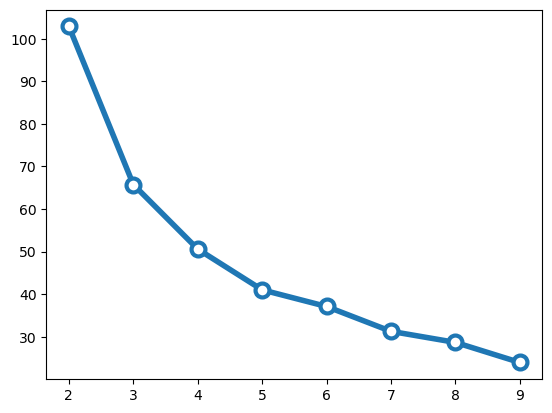

In [479]:
# Number of clusters to try out
n_clusters = list(range(2, 10))

# Run kmeans for each value of k
inertias = []
for k in n_clusters:
    
    # Initialize and run
    kmeans = KMeans(n_clusters=k, n_init=10)
    kmeans.fit(amenities_nb_scaled)
    
    # Save the "inertia"
    inertias.append(kmeans.inertia_)
    
# Plot it!
plt.plot(n_clusters, inertias, marker='o', ms=10, mfc='white', lw=4, mew=3);

In [481]:
from kneed import KneeLocator

# Initialize the knee algorithm
kn = KneeLocator(n_clusters, inertias, curve='convex', direction='decreasing')

# Print out the knee 
print(kn.knee)

4
